In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install git+https://github.com/SaminRK/scPSS.git

  Cloning https://github.com/SaminRK/scPSS.git to /tmp/pip-req-build-oy204jrm
  Running command git clone --filter=blob:none --quiet https://github.com/SaminRK/scPSS.git /tmp/pip-req-build-oy204jrm
  Resolved https://github.com/SaminRK/scPSS.git to commit c16c71713e6a618ed6196b83b1dc3daa30838e1a
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [3]:
!pip install scanpy scikit-misc

## Download Data

The original data is from https://doi.org/10.1038/ncomms14049.

The following data download and preprocessing script is borrowed from https://github.com/suinleelab/contrastiveVI/blob/main/contrastive_vi/data/datasets/zheng_2017.py from the work https://doi.org/10.1038/s41592-023-01955-3.

In [4]:
import os
import shutil
from scipy.io import mmread
import pandas as pd
import numpy as np
import scanpy as sc
from anndata import AnnData

In [5]:
def read_zheng_2017(file_directory: str) -> pd.DataFrame:
    """
    Read the expression data for in a downloaded file directory.

    Args:
    ----
        file_directory: A downloaded and unzipped file directory.

    Returns
    -------
        A data frame containing single-cell gene expression count, with cell
        identification barcodes as column names and gene IDs as indices.
    """
    data = mmread(
        os.path.join(file_directory, "filtered_matrices_mex/hg19/matrix.mtx")
    ).toarray()
    genes = pd.read_table(
        os.path.join(file_directory, "filtered_matrices_mex/hg19/genes.tsv"),
        header=None,
    )
    barcodes = pd.read_table(
        os.path.join(file_directory, "filtered_matrices_mex/hg19/barcodes.tsv"),
        header=None,
    )
    return pd.DataFrame(
        data, index=genes.iloc[:, 0].values, columns=barcodes.iloc[:, 0].values
    )

In [6]:
def preprocess_zheng_2017(download_path: str, n_top_genes: int) -> AnnData:
    """
    Preprocess expression data from Zheng et al. 2017.

    Args:
    ----
        download_path: Path containing the downloaded and unzipped file
            directories.
        n_top_genes: Number of most variable genes to retain.

    Returns
    -------
        An AnnData object containing single-cell expression data. The layer
        "count" contains the count data for the most variable genes. The X
        variable contains the total-count-normalized and log-transformed data
        for the most variable genes (a copy with all the genes is stored in
        .raw).
    """
    file_directory_dict = {
        "aml027_pre_transplant": ("aml027_pre_transplant_filtered_gene_bc_matrices"),
        "aml027_post_transplant": ("aml027_post_transplant_filtered_gene_bc_matrices"),
        "aml035_pre_transplant": ("aml035_pre_transplant_filtered_gene_bc_matrices"),
        "aml035_post_transplant": ("aml035_post_transplant_filtered_gene_bc_matrices"),
        "donor1_healthy": ("frozen_bmmc_healthy_donor1_filtered_gene_bc_matrices"),
        "donor2_healthy": ("frozen_bmmc_healthy_donor2_filtered_gene_bc_matrices"),
    }
    df_dict = {
        sample_id: read_zheng_2017(os.path.join(download_path, file_directory))
        for sample_id, file_directory in file_directory_dict.items()
    }
    gene_set_list = []
    for sample_id, df in df_dict.items():
        df = df.iloc[:, np.sum(df.values, axis=0) != 0]
        df = df.iloc[np.sum(df.values, axis=1) != 0, :]
        df = df.transpose()
        gene_set_list.append(set(df.columns))
        patient_id, condition = sample_id.split("_", 1)
        df["patient_id"] = patient_id
        df["condition"] = condition
        df_dict[sample_id] = df
    shared_genes = list(set.intersection(*gene_set_list))
    data_list = []
    meta_data_list = []
    for df in df_dict.values():
        data_list.append(df[shared_genes])
        meta_data_list.append(df[["patient_id", "condition"]])
    data = pd.concat(data_list)
    meta_data = pd.concat(meta_data_list)
    adata = AnnData(X=data.reset_index(drop=True), obs=meta_data.reset_index(drop=True))
    adata.layers["count"] = adata.X.copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    adata.raw = adata
    sc.pp.highly_variable_genes(
        adata,
        flavor="seurat_v3",
        n_top_genes=n_top_genes,
        layer="count",
        subset=True,
    )
    adata = adata[adata.layers["count"].sum(1) != 0]  # Remove cells with all zeros.
    return adata

In [7]:
DATA_PATH = "/content/drive/MyDrive/Research - Sohel sir/Pathological Cells/Pathological Cell Identification/data/Zheng 2017"
ad = preprocess_zheng_2017(DATA_PATH, n_top_genes=5_000)

/usr/local/lib/python3.11/dist-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [8]:
ad

View of AnnData object with n_obs × n_vars = 16856 × 5000
    obs: 'patient_id', 'condition'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg'
    layers: 'count'

In [9]:
sc.tl.pca(ad)

/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


In [10]:
import matplotlib.pyplot as plt

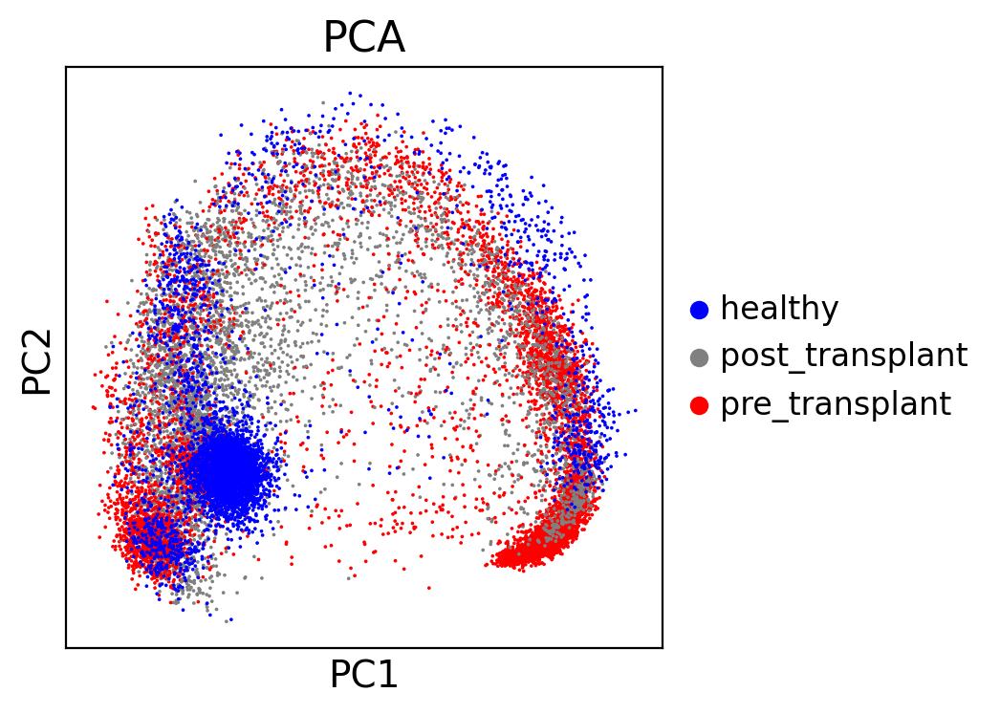

In [11]:
# sc.pl.pca(ad, color='condition')
# Set parameters for plotting
import seaborn as sns

# Define custom color palette
custom_palette = sns.color_palette(['blue', 'grey', 'red'])
sc.settings.set_figure_params(dpi=100, dpi_save=300, vector_friendly=True, fontsize=12)

# Plot PCA with customizations
sc.pl.pca(ad, color='condition', palette=custom_palette, frameon=True, legend_fontsize=12, title='', show=False)

# Increase label sizes
plt.gca().set_xlabel('PC1', fontsize=14)
plt.gca().set_ylabel('PC2', fontsize=14)
plt.gca().set_title('PCA', fontsize=16)

# Show the plot
# plt.show()
plt.savefig('panel-A.svg')

In [12]:
ad.obs['sample'] = ad.obs['patient_id'].astype(str) + '_' + ad.obs['condition'].astype(str)

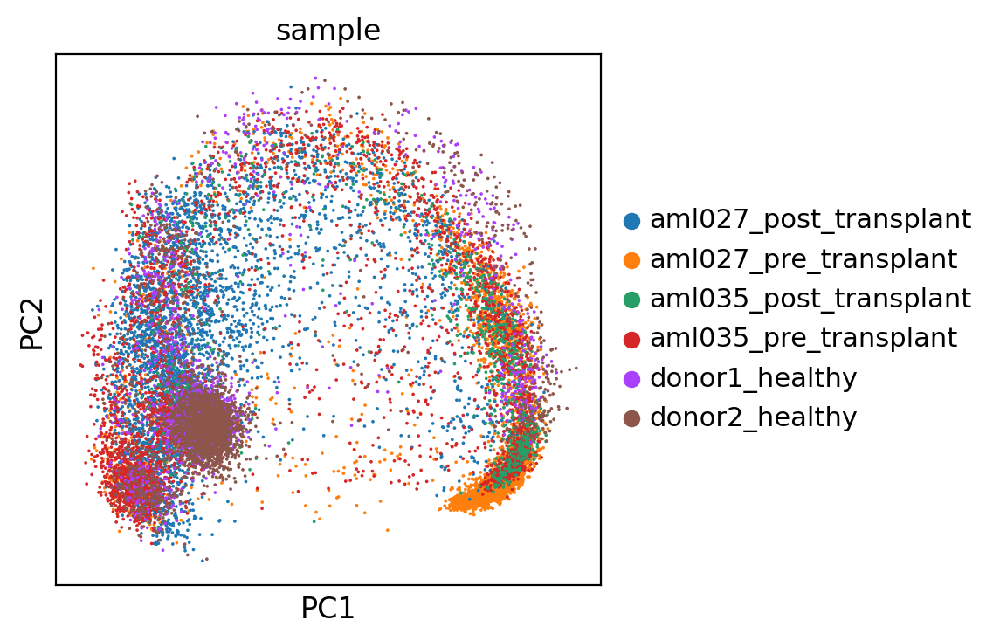

In [13]:
sc.pl.pca(ad, color='sample')

In [14]:
!pip install igraph leidenalg

In [15]:
sc.pp.neighbors(ad)
sc.tl.leiden(ad, resolution=0.7)

/tmp/ipython-input-15-1369885124.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(ad, resolution=0.7)


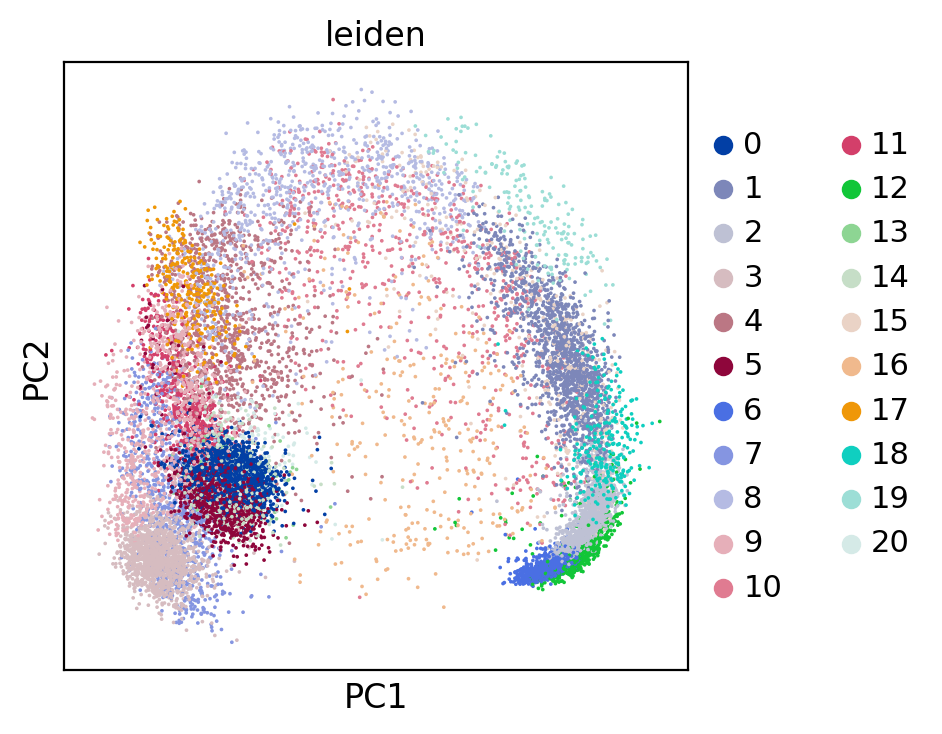

In [16]:
sc.pl.pca(ad, color=['leiden'])

In [17]:
sc.tl.rank_genes_groups(ad, groupby='leiden', use_raw=False)
sc.pl.rank_genes_groups(ad, n_genes=20, sharey=False)

Output hidden; open in https://colab.research.google.com to view.

In [18]:
!pip install mygene

In [19]:
import mygene

# Prepare ENSG IDs from adh.var_names by removing version numbers if present
ensg_ids = ad.var_names.str.split('.').str[0].tolist()

mg = mygene.MyGeneInfo()

# Query mygene to get gene symbols
query_results = mg.querymany(ensg_ids, scopes='ensembl.gene', fields='symbol', species='human', as_dataframe=True)

query_results.index.name = 'ensembl_id'
query_results.reset_index(inplace=True)

# Create mapping dict: ENSG -> gene symbol
ensg_to_symbol = dict(zip(query_results['ensembl_id'], query_results['symbol']))

# Map gene symbols back to adh.var aligned with adh.var_names
gene_symbols = [ensg_to_symbol.get(gene_id, '') for gene_id in ensg_ids]

ad.var['gene_symbol'] = gene_symbols

print(ad.var[['gene_symbol']].head(10))


INFO:biothings.client:querying 1-1000 ...
INFO:biothings.client:querying 1001-2000 ...
INFO:biothings.client:querying 2001-3000 ...
INFO:biothings.client:querying 3001-4000 ...
INFO:biothings.client:querying 4001-5000 ...
INFO:biothings.client:Finished.
INFO:biothings.client:Pass "returnall=True" to return complete lists of duplicate or missing query terms.


                gene_symbol
ENSG00000250722     SELENOP
ENSG00000105135       HACL2
ENSG00000142327     RNPEPL1
ENSG00000075142         SRI
ENSG00000253187   HOXA10-AS
ENSG00000229645         NaN
ENSG00000186205      MTARC1
ENSG00000165655      ZNF503
ENSG00000239911  PRKAG2-AS1
ENSG00000169750        RAC3


In [20]:
ad.var.to_csv('ad.var.csv')

In [21]:
import mygene

mg = mygene.MyGeneInfo()

# marker_genes_celltype = {
#     "Blasts and Immature Ery 1": {"CD34", "GATA2"},
#     "Immature Ery 2": {"GATA1"},
#     "Immature Ery 3": {"TFRC"},  # CD71 => TFRC
#     "Mature Ery": {"HBA1"},
#     "Immature Granulocytes": {"AZU1", "CXCL8"},  # IL8 => CXCL8
#     "Monocytes": {"CD14", "FCN1"},
#     "B": {"CD19", "CD79A"},
#     "T": {"CD3D", "CD8A"}
# }

# marker_genes_celltype = {
#     "Erythrocytes": {"HBA1", "TFRC", "GATA1"},
#     "Monocytes": {"CD14", "FCN1"},
#     "Granulocytes": {"AZU1", "CXCL8"},
#     "Blasts": {"CD34", "GATA2"},
#     "B cells": {"CD19", "CD79A"},
#     "T cells": {"CD3D", "CD8A"}
# }

# marker_genes_celltype = {
#     "Erythrocytes": {"HBA1", "HBB", "TFRC", "GATA1", "KLF1", "ALAS2", "EPOR"},
#     "Monocytes": {"CD14", "LYZ", "FCN1", "S100A8", "VCAN", "ITGAM", "MS4A7"},
#     # "Granulocytes": {"AZU1", "ELANE", "MPO", "PRTN3", "CTSG", "CXCL8", "CEACAM8", "S100A12", "FCGR3B"},
#     "Blasts": {"CD34", "PROM1", "GATA2", "HOXA9", "FLT3", "KIT", "CD38"},
#     "B cells": {"CD19", "CD79A", "MS4A1", "CD22", "BANK1", "TCL1A", "IGKC"},
#     "T cells": {"CD3D", "CD3E", "CD8A", "CD8B", "CD4", "TRAC", "TRBC1", "LEF1"}
# }

marker_genes_celltype = {
    "Erythroid": {"HBA1", "TFRC", "GATA1"},
    "Blasts": {"CD34", "GATA2"},
    "Monocyte–Granulocyte Lineage": {"CD14", "FCN1", "AZU1", "CXCL8"},
    "B cells": {"CD19", "CD79A"},
    "T cells": {"CD3D", "CD8A"},
}


def convert_symbols_to_all_ensembl(gene_symbols):
    query = mg.querymany(list(gene_symbols), scopes='symbol', fields='ensembl.gene', species='human')
    symbol_to_ensembl = {}
    for res in query:
        symbol = res['query']
        ensembl = res.get('ensembl')
        if isinstance(ensembl, list):
            ensembl_ids = {e['gene'] for e in ensembl if 'gene' in e}
        elif isinstance(ensembl, dict):
            ensembl_ids = {ensembl.get('gene')} if 'gene' in ensembl else set()
        else:
            ensembl_ids = set()

        symbol_to_ensembl[symbol] = ensembl_ids
    return symbol_to_ensembl

# Convert and aggregate Ensembl IDs per cell type
marker_genes_ensembl = {}
for cell_type, genes in marker_genes_celltype.items():
    mapping = convert_symbols_to_all_ensembl(genes)
    combined_ids = set()
    for ensembl_set in mapping.values():
        combined_ids.update(ensembl_set)
    marker_genes_ensembl[cell_type] = combined_ids

marker_genes_ensembl

INFO:biothings.client:querying 1-3 ...
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-2 ...
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-4 ...
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-2 ...
INFO:biothings.client:Finished.
INFO:biothings.client:querying 1-2 ...
INFO:biothings.client:Finished.


{'Erythroid': {'ENSG00000072274', 'ENSG00000102145', 'ENSG00000206172'},
 'Blasts': {'ENSG00000174059', 'ENSG00000179348'},
 'Monocyte–Granulocyte Lineage': {'ENSG00000085265',
  'ENSG00000169429',
  'ENSG00000170458',
  'ENSG00000172232',
  'ENSG00000278624'},
 'B cells': {'ENSG00000105369', 'ENSG00000177455'},
 'T cells': {'ENSG00000153563', 'ENSG00000167286'}}

In [22]:
# Assuming adata.var_names is a list-like of Ensembl IDs
adata_ensembl_genes = set(ad.var_names)

filtered_marker_genes = {}
for cell_type, ensg_set in marker_genes_ensembl.items():
    # Keep only those Ensembl IDs that exist in your adata
    filtered_marker_genes[cell_type] = sorted(list(ensg_set.intersection(adata_ensembl_genes)))

# Flatten all Ensembl IDs into a single list (unique) for plotting or analysis
all_marker_ensembl_genes = sorted(list(set(g for genes in filtered_marker_genes.values() for g in genes)))

filtered_marker_genes
# all_marker_ensembl_genes


{'Erythroid': ['ENSG00000072274', 'ENSG00000102145', 'ENSG00000206172'],
 'Blasts': ['ENSG00000174059', 'ENSG00000179348'],
 'Monocyte–Granulocyte Lineage': ['ENSG00000085265',
  'ENSG00000169429',
  'ENSG00000170458',
  'ENSG00000172232'],
 'B cells': ['ENSG00000105369'],
 'T cells': ['ENSG00000153563', 'ENSG00000167286']}

categories: 0, 1, 2, etc.
var_group_labels: Erythroid, Blasts, Monocyte–Granulocyte Lineage, etc.


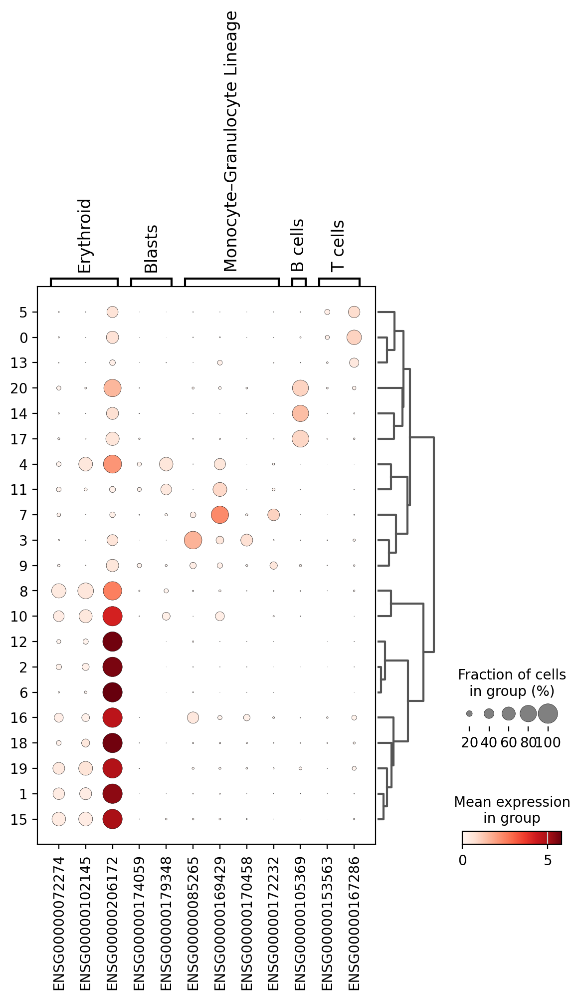

In [23]:
sc.tl.dendrogram(ad, groupby='leiden')
sc.pl.dotplot(ad, filtered_marker_genes, "leiden", dendrogram=True)

In [24]:
ranks = ad.uns['rank_genes_groups']

# Build mapping from version-stripped ENSG IDs to gene symbols
ensg_no_version = ad.var_names.str.split('.').str[0]
ensg_to_symbol = dict(zip(ensg_no_version, ad.var['gene_symbol']))
cluster_celltype_map = {}

def assign_cell_type_by_overlap_and_rank(top_genes, marker_dict):
    """
    Assigns cell type by:
    1. Number of matching marker genes (higher is better).
    2. If tie, prefers the one with the best (lowest) rank among matches.
    """
    best_cell_type = 'Unknown'
    best_overlap_count = 0
    best_rank = len(top_genes)  # Larger than any possible rank

    for cell_type, markers in marker_dict.items():
        matched = [i for i, gene in enumerate(top_genes) if gene in markers]
        overlap_count = len(matched)
        if overlap_count == 0:
            continue

        min_rank = min(matched)  # Best rank among matches

        # Compare by overlap count, then by rank
        if (overlap_count > best_overlap_count) or \
           (overlap_count == best_overlap_count and min_rank < best_rank):
            best_cell_type = cell_type
            best_overlap_count = overlap_count
            best_rank = min_rank

    if best_cell_type == 'Unknown':
        return 'Unknown', set()

    # Return matched markers
    matched_markers = set(top_genes[i] for i in range(len(top_genes)) if top_genes[i] in marker_dict[best_cell_type])
    return best_cell_type, matched_markers

for group in ranks['names'].dtype.names:
    ensg_ids = ranks['names'][group]
    ensg_ids_noversion = [str(g).split('.')[0] for g in ensg_ids[:200]]

    symbols = []
    for g in ensg_ids_noversion:
        sym = ensg_to_symbol.get(g, 'Unknown')
        if not isinstance(sym, str) or sym == '' or sym is None:
            sym = 'Unknown'
        else:
            sym = sym.upper()
        symbols.append(sym)

    cell_type, max_overlap = assign_cell_type_by_overlap_and_rank(symbols, marker_genes_celltype)
    cluster_celltype_map[group] = cell_type

    print(f"Cluster '{group}': \tAssigned cell type: {cell_type} \t\t\tMatched Genes: ", max_overlap)

Cluster '0': 	Assigned cell type: T cells 			Matched Genes:  {'CD3D', 'CD8A'}
Cluster '1': 	Assigned cell type: Erythroid 			Matched Genes:  {'GATA1', 'TFRC', 'HBA1'}
Cluster '2': 	Assigned cell type: Erythroid 			Matched Genes:  {'GATA1', 'TFRC', 'HBA1'}
Cluster '3': 	Assigned cell type: Monocyte–Granulocyte Lineage 			Matched Genes:  {'FCN1', 'CD14'}
Cluster '4': 	Assigned cell type: Blasts 			Matched Genes:  {'GATA2'}
Cluster '5': 	Assigned cell type: T cells 			Matched Genes:  {'CD3D', 'CD8A'}
Cluster '6': 	Assigned cell type: Erythroid 			Matched Genes:  {'HBA1'}
Cluster '7': 	Assigned cell type: Monocyte–Granulocyte Lineage 			Matched Genes:  {'AZU1', 'CXCL8'}
Cluster '8': 	Assigned cell type: Erythroid 			Matched Genes:  {'GATA1'}
Cluster '9': 	Assigned cell type: Monocyte–Granulocyte Lineage 			Matched Genes:  {'AZU1'}
Cluster '10': 	Assigned cell type: Erythroid 			Matched Genes:  {'GATA1', 'TFRC', 'HBA1'}
Cluster '11': 	Assigned cell type: Blasts 			Matched Genes:  {'GATA2'}


In [25]:
# Make sure your leiden clusters are string type for mapping keys
ad.obs['leiden'] = ad.obs['leiden'].astype(str)

# Map cluster labels to assigned cell types
ad.obs['cell_type'] = ad.obs['leiden'].map(cluster_celltype_map).fillna('Unknown')

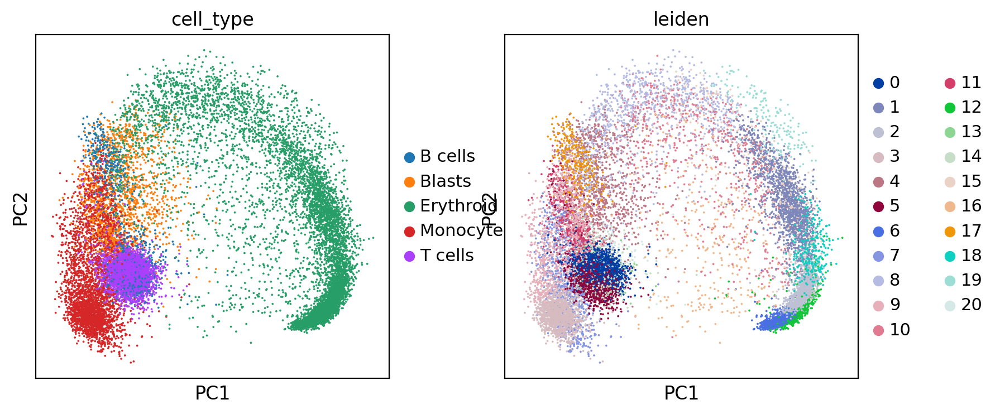

In [26]:
sc.pl.pca(ad, color=['cell_type', 'leiden'])

In [27]:
sc.tl.tsne(ad, n_pcs=50)

In [28]:
ad

AnnData object with n_obs × n_vars = 16856 × 5000
    obs: 'patient_id', 'condition', 'sample', 'leiden', 'cell_type'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'gene_symbol'
    uns: 'log1p', 'hvg', 'pca', 'condition_colors', 'sample_colors', 'neighbors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden', 'cell_type_colors', 'tsne'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    layers: 'count'
    obsp: 'distances', 'connectivities'

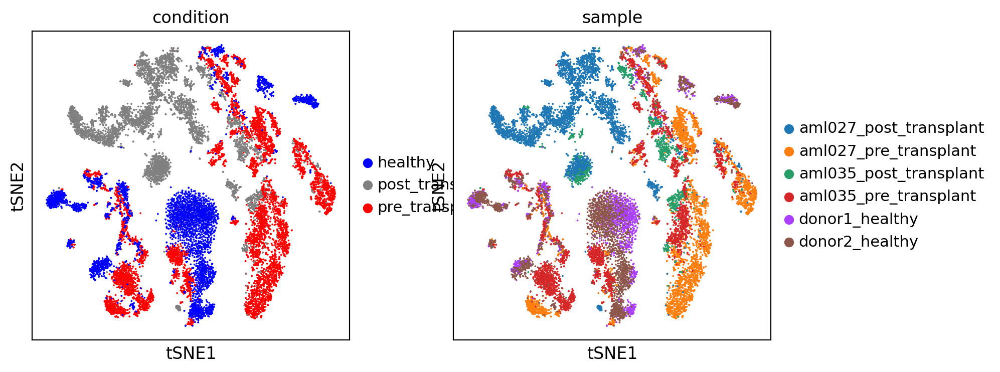

In [29]:
sc.pl.tsne(ad, color=['condition', 'sample'])

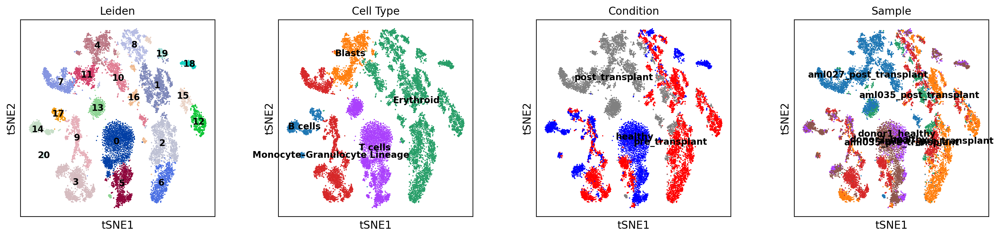

In [30]:
sc.pl.tsne(
    ad,
    color=['leiden', 'cell_type', 'condition', 'sample'],
    legend_loc='on data',    # places labels on the plot
    legend_fontsize=10,
    title=['Leiden', 'Cell Type', 'Condition', 'Sample']
)

## Run scPSS with large k values

In [31]:
healthy_patient_ids = ad[ad.obs['condition'] == 'healthy'].obs['patient_id'].unique()
bmmc_patient_ids = ad[ad.obs['condition'] != 'healthy'].obs['patient_id'].unique()

In [32]:
from scpss import scPSS

scpss = scPSS(ad, 'patient_id', healthy_patient_ids, bmmc_patient_ids)
scpss.harmony_integrate()
params = scpss.find_optimal_parameters(search_ks=np.arange(0, 501, 5))
scpss.set_distance_and_condition()

2025-07-17 15:18:04,240 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


✅ PCA Complete.


2025-07-17 15:18:07,239 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-07-17 15:18:07,316 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-07-17 15:18:10,748 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-07-17 15:18:15,220 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-07-17 15:18:18,882 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations


✅ Harmony Integration Complete.
✅ Found Optimal Parameters.
✅ Stored distances and conditions in Anndata object.


In [33]:
dists_ref_ref = scpss.adata.obs.loc[scpss.reference_mask, 'scpss_scores']
dists_que_ref = scpss.adata.obs.loc[scpss.query_mask, 'scpss_scores']
thres = scpss.best_params['threshold']

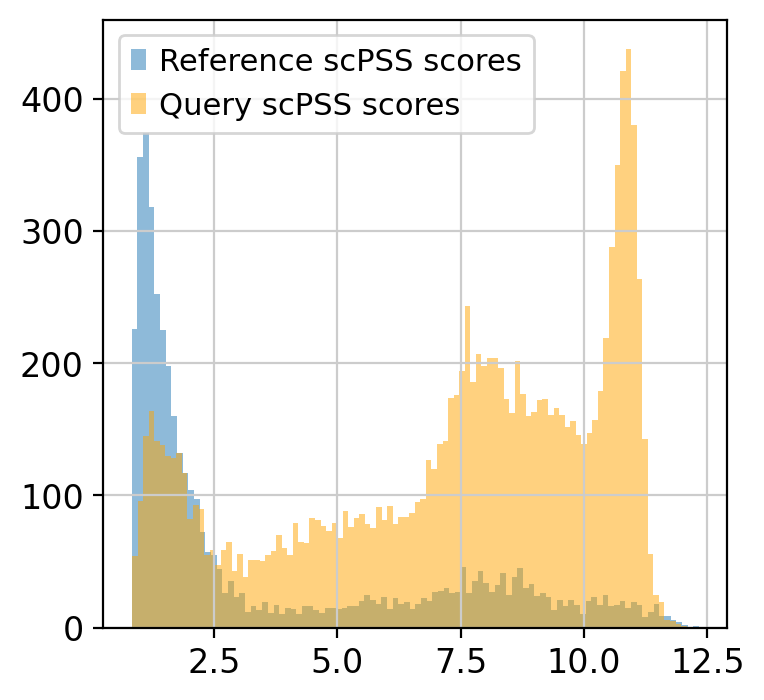

In [34]:
import matplotlib.pyplot as plt

plt.hist(dists_ref_ref, bins=100, alpha=.5, label='Reference scPSS scores')
plt.hist(dists_que_ref, bins=100, alpha=.5, color='orange', label='Query scPSS scores')
plt.legend()
plt.show()

In [35]:
ad_que = scpss.adata[scpss.query_mask]

dists_que_post = dists_que_ref[ad_que.obs['condition'] == 'post_transplant']
dists_que_pre = dists_que_ref[ad_que.obs['condition'] == 'pre_transplant']

In [36]:
print(np.mean(dists_que_post > thres), np.mean(dists_que_pre > thres))
print(np.mean(np.concatenate([dists_que_post, dists_que_pre]) > thres))

0.3399671727533853 0.7421926910299004
0.5840793612388095


In [37]:
print(np.mean(ad_que[ad_que.obs['condition'] == 'post_transplant'].obs['scpss_condition'] == 'pathological'),
      np.mean(np.mean(ad_que[ad_que.obs['condition'] == 'pre_transplant'].obs['scpss_condition'] == 'pathological')))
print(scpss.best_params['optimal_p'])
print(scpss.best_params['optimal_k'])

0.3399671727533853 0.7421926910299004
0.1
500


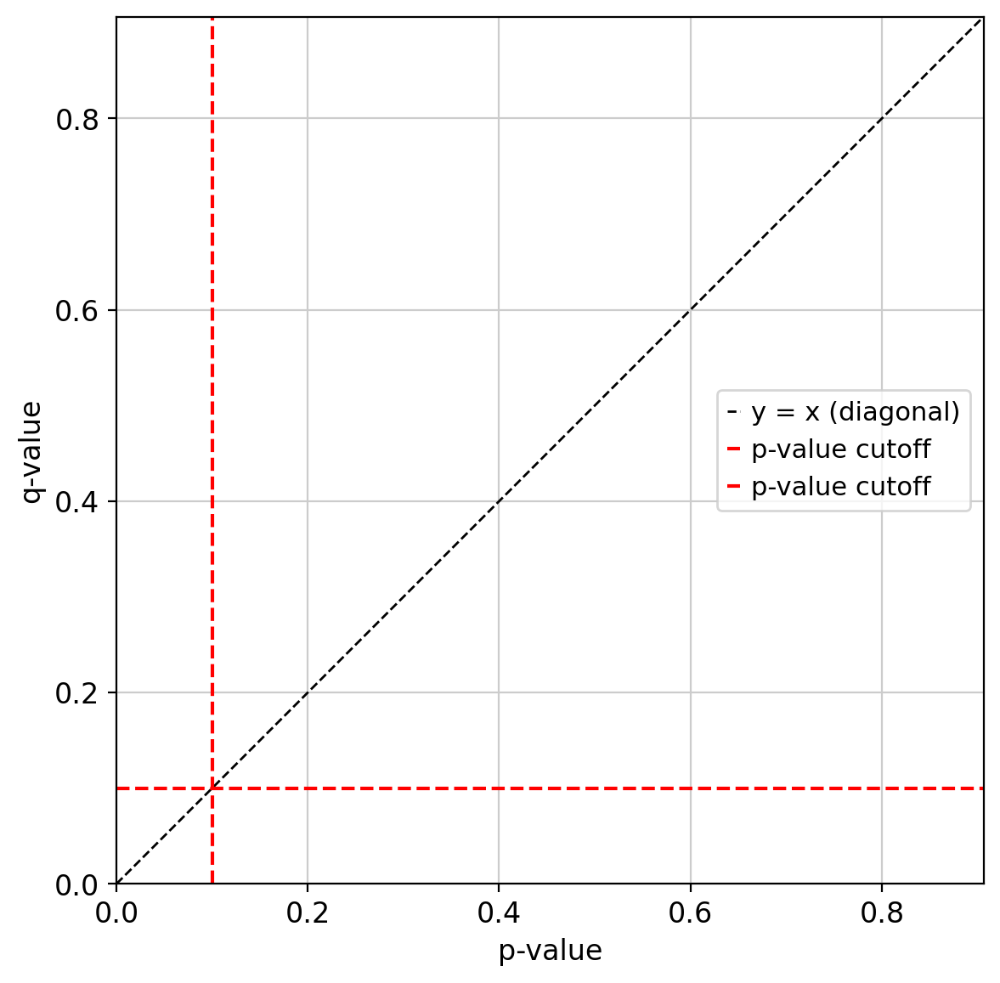

In [38]:
ad1 = scpss.adata[scpss.query_mask]

plt.figure(figsize=(6, 6))  # optional: square plot for better comparison
plt.scatter(ad1.obs['scpss_p_values'], ad1.obs['scpss_q_values'], alpha=0.6)

# Axis labels
plt.xlabel('p-value')
plt.ylabel('q-value')

# Diagonal line (y = x)
lims = [0, max(ad1.obs['scpss_p_values'].max(), ad1.obs['scpss_q_values'].max())]
plt.plot(lims, lims, 'k--', label='y = x (diagonal)', linewidth=1)

# Red vertical line for p-value cutoff
plt.axvline(scpss.best_params['optimal_p'], color='r', linestyle='--', label='p-value cutoff')
plt.axhline(scpss.best_params['optimal_p'], color='r', linestyle='--', label='p-value cutoff')


# Equal aspect ratio and axes
plt.xlim(lims)
plt.ylim(lims)
plt.gca().set_aspect('equal', adjustable='box')

# Optional: legend
plt.legend()

plt.tight_layout()
plt.show()


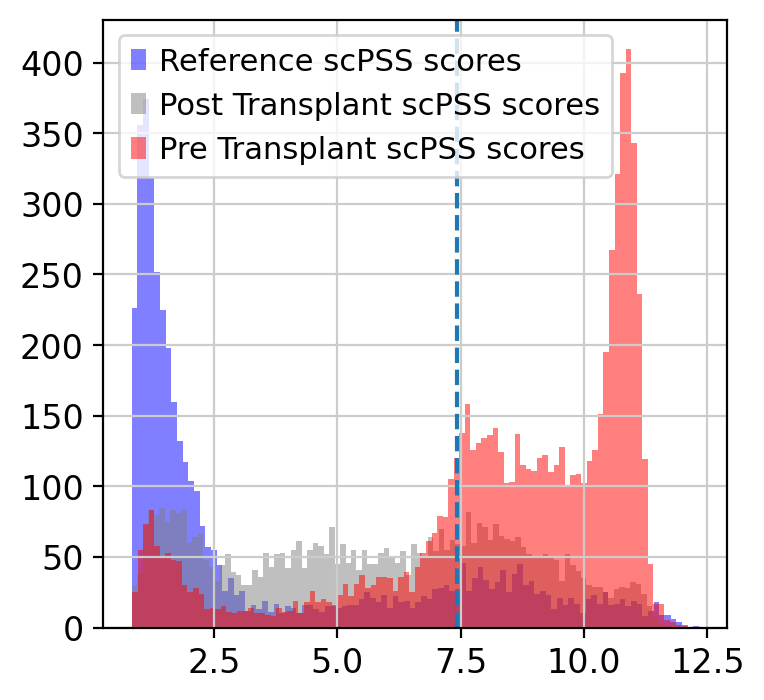

In [39]:
colors = sns.color_palette(['blue', 'grey', 'red'])

plt.hist(dists_ref_ref, bins=100, alpha=.5, color=colors[0], label='Reference scPSS scores')
plt.hist(dists_que_post, bins=100, alpha=.5, color=colors[1], label='Post Transplant scPSS scores')
plt.hist(dists_que_pre, bins=100, alpha=.5, color=colors[2], label='Pre Transplant scPSS scores')
plt.axvline(thres, ls='--')
plt.legend()
# plt.show()
plt.savefig('Panel-B.svg')

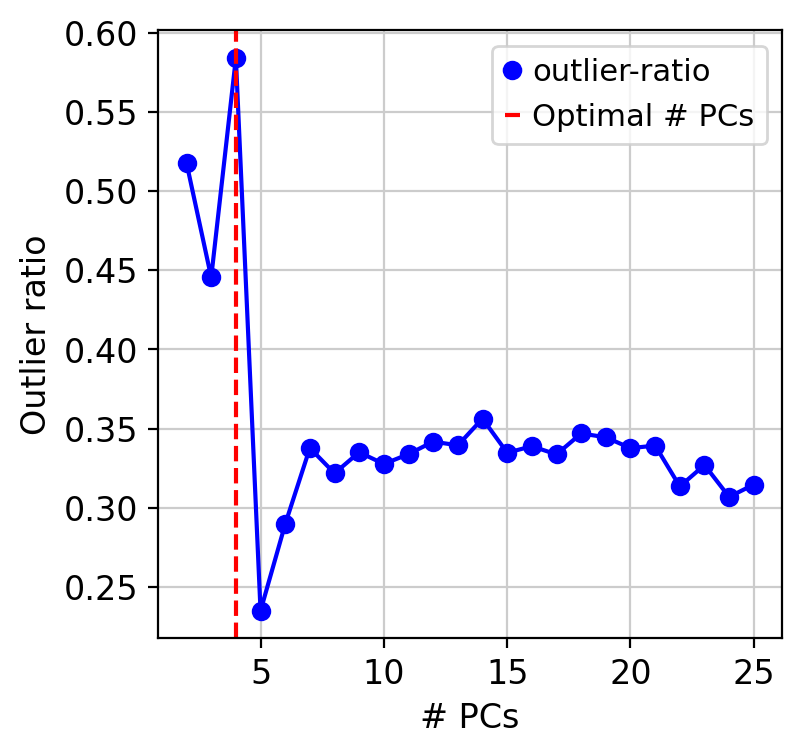

In [40]:
x_values = []
y_values = []
optimal_params = None
best_outlier_ratio = 0
for param in params:
    if (param['outlier_ratio'] > best_outlier_ratio):
        best_outlier_ratio = param['outlier_ratio']
        optimal_params = param
    x_values.append(param['n_comps'])
    y_values.append(param['outlier_ratio'])
plt.plot(x_values, y_values, marker='o', linestyle='-', color='b', label='outlier-ratio')
plt.legend()
plt.xlabel('# PCs')
plt.ylabel('Outlier ratio')
plt.axvline(optimal_params['n_comps'], color='r', linestyle='--', label='Optimal # PCs')
plt.legend()

plt.savefig('outlier-ratios-ncomps.svg')
plt.show()

In [41]:
ks = scpss.best_params['ks']
outlier_ratios_for_k = scpss.best_params['outlier_ratios_for_k']
optimal_k = scpss.best_params['optimal_k']

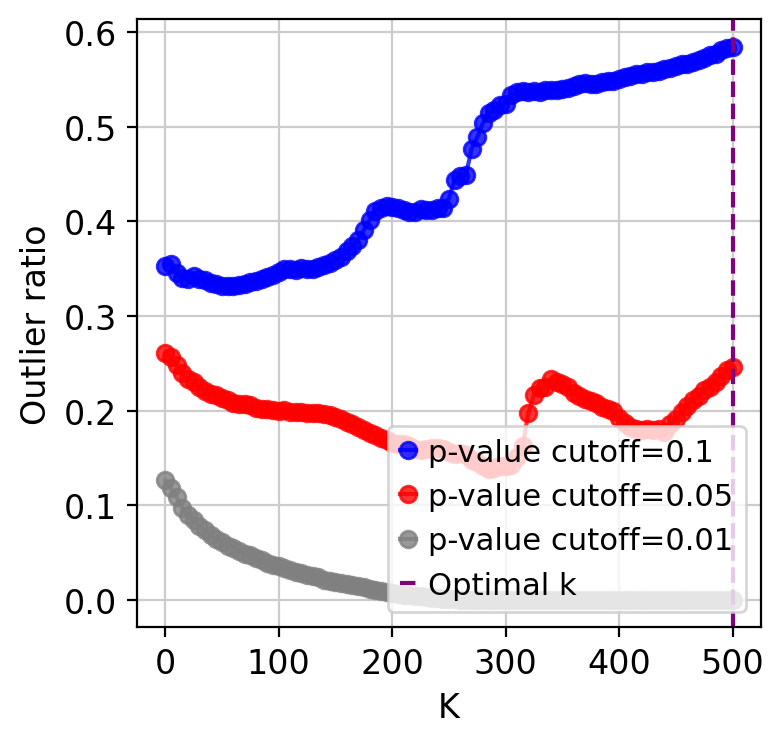

In [42]:
x_values, y_values = ks, outlier_ratios_for_k[:, 0]
plt.plot(x_values, y_values, marker='o', linestyle='-', color='b', alpha=.8, label='p-value cutoff=0.1')

x_values, y_values = ks, outlier_ratios_for_k[:, 1]
plt.plot(x_values, y_values, marker='o', linestyle='-', color='r', alpha=.8, label='p-value cutoff=0.05')

x_values, y_values = ks, outlier_ratios_for_k[:, 2]
plt.plot(x_values, y_values, marker='o', linestyle='-', color='grey', alpha=.8, label='p-value cutoff=0.01')

plt.axvline(optimal_k, color='purple', linestyle='--', label='Optimal k')
plt.xlabel('K')
plt.ylabel('Outlier ratio')
plt.legend(loc='lower right')

plt.savefig('outlier-ratios-k.svg')
plt.show()

In [43]:
ps = scpss.best_params['ps']
outlier_ratios_for_p = scpss.best_params['outlier_ratios_for_p']
optimal_p = scpss.best_params['optimal_p']

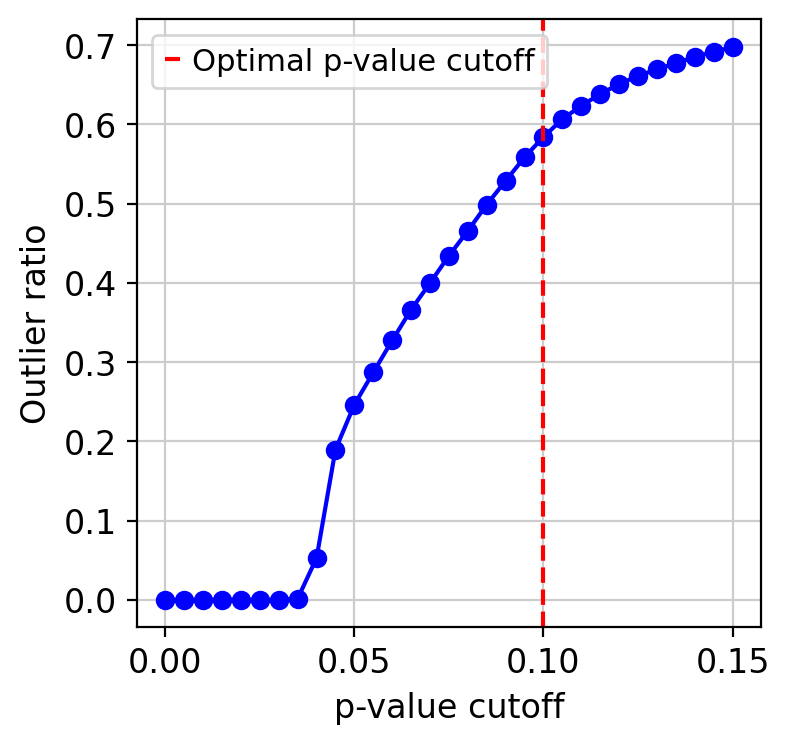

In [44]:
plt.plot(ps, outlier_ratios_for_p, marker='o', linestyle='-', color='b')
plt.axvline(optimal_p, color='r', linestyle='--', label='Optimal p-value cutoff')
plt.legend()

plt.xlabel('p-value cutoff')
plt.ylabel('Outlier ratio')

plt.savefig('outlier-ratios-p-val.svg')
plt.show()

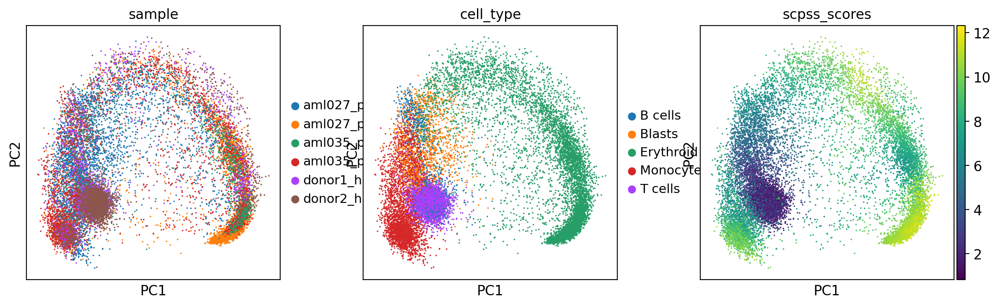

In [45]:
sc.pl.pca(scpss.adata, color=['sample', 'cell_type', 'scpss_scores'])

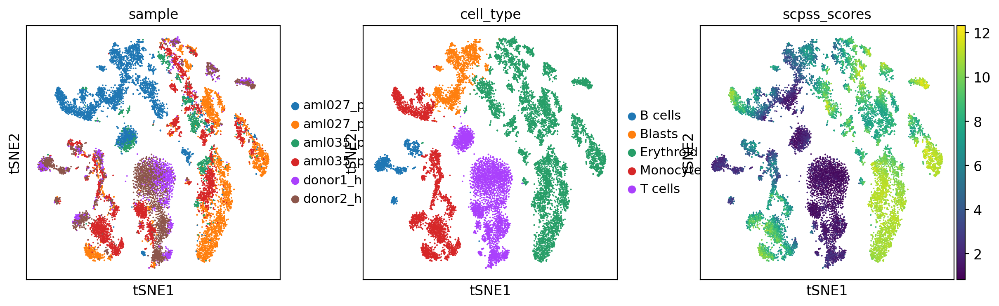

In [46]:
sc.pl.tsne(scpss.adata, color=['sample', 'cell_type', 'scpss_scores'])

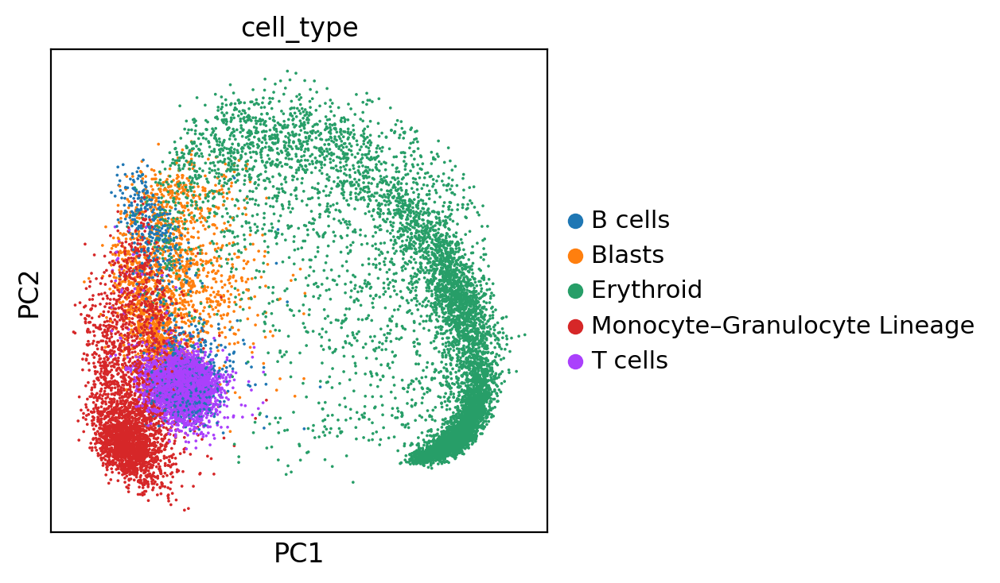

In [47]:
sc.pl.pca(scpss.adata, color=['cell_type'], show=False)
plt.savefig("bmmc-celltype.svg")

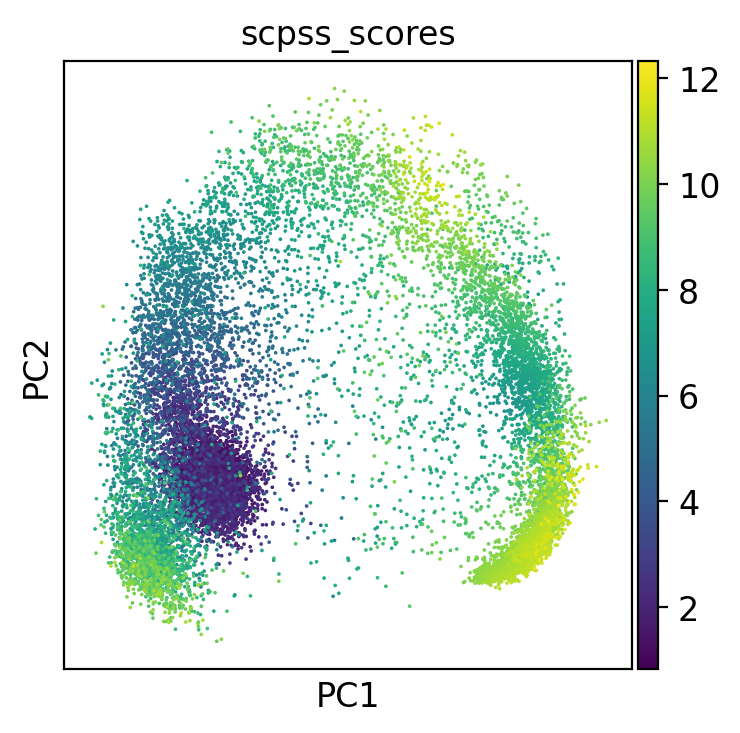

In [48]:
sc.pl.pca(scpss.adata, color=['scpss_scores'], show=False)
plt.savefig("bmmc-scpss_scores.svg")

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique samples
samples = scpss.adata.obs['sample'].unique()

# Initialize color map
sample_colors = {}

# Filter only AML and Healthy samples
aml_samples = [s for s in samples if 'aml' in s.lower()]
healthy_samples = [s for s in samples if 'healthy' in s.lower()]

# Use DARKER shades: take colors from the **end** of the colormap
reds = sns.color_palette("Reds", n_colors=len(aml_samples) + 3)[-len(aml_samples):]
greens = sns.color_palette("Greens", n_colors=len(healthy_samples) + 3)[-len(healthy_samples):]

# Assign colors
for i, sample in enumerate(aml_samples):
    sample_colors[sample] = reds[i]
for i, sample in enumerate(healthy_samples):
    sample_colors[sample] = greens[i]

# Optional: assign gray to any other sample types
for sample in samples:
    if sample not in sample_colors:
        sample_colors[sample] = 'gray'


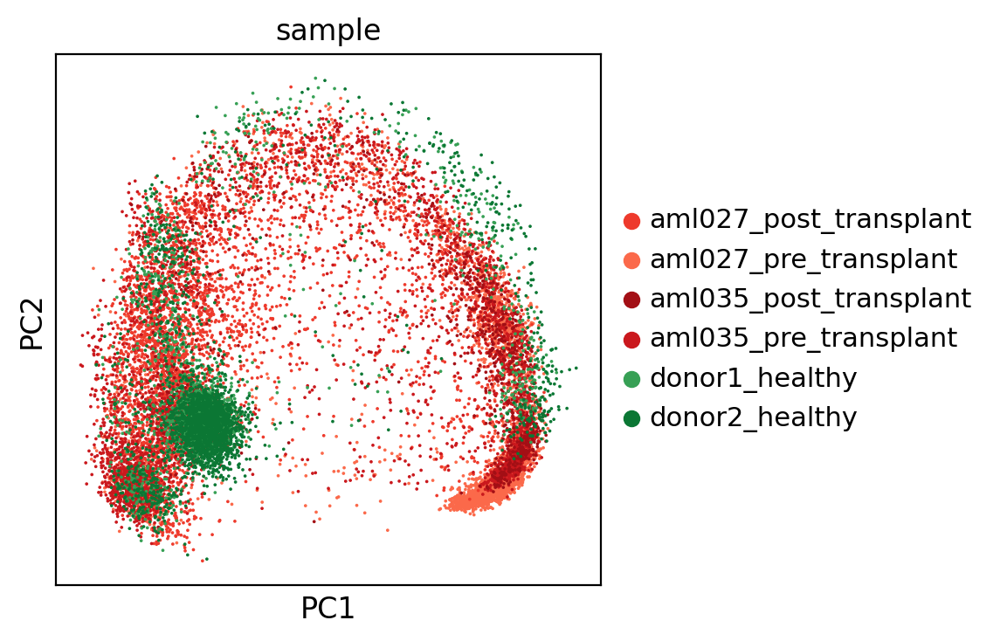

In [50]:
sc.pl.pca(scpss.adata, color='sample', palette=sample_colors, show=False)
plt.savefig("bmmc-sample.svg")
plt.show()

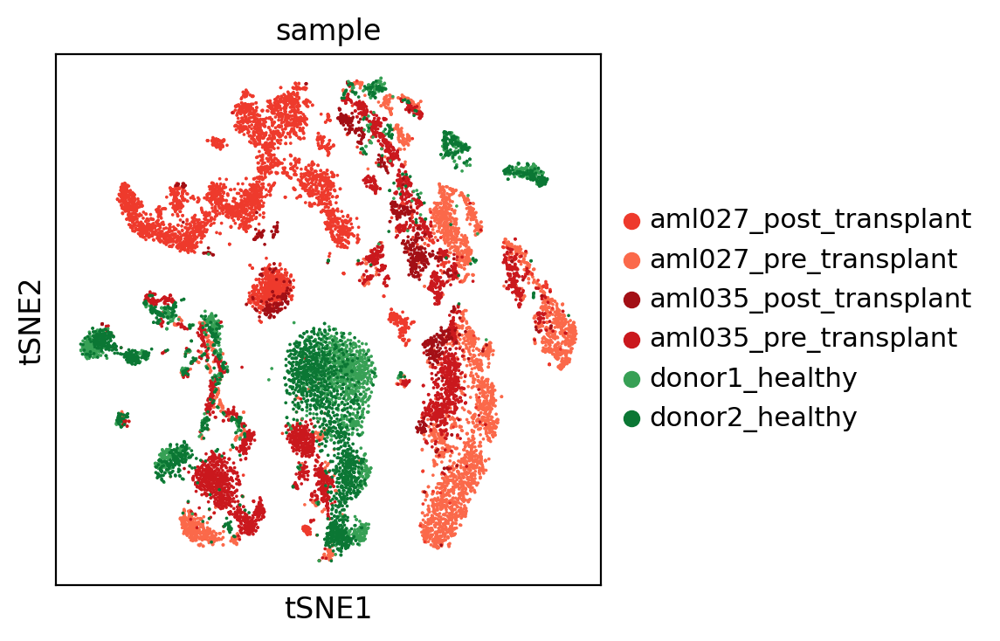

In [51]:
sc.pl.tsne(scpss.adata, color='sample', palette=sample_colors, show=False)
plt.show()

In [52]:
scpss.adata

AnnData object with n_obs × n_vars = 16856 × 5000
    obs: 'patient_id', 'condition', 'sample', 'leiden', 'cell_type', 'scpss_scores', 'scpss_p_values', 'scpss_q_values', 'scpss_outlier_uncorrected', 'scpss_outlier', 'scpss_condition'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'gene_symbol'
    uns: 'log1p', 'hvg', 'pca', 'condition_colors', 'sample_colors', 'neighbors', 'leiden', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden', 'cell_type_colors', 'tsne'
    obsm: 'X_pca', 'X_tsne', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'count'
    obsp: 'distances', 'connectivities'

/tmp/ipython-input-53-3564915573.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  scpss.adata.obs['condition_label'] = scpss.adata.obs['condition'].replace({
/tmp/ipython-input-53-3564915573.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ordering_df = plot_df[plot_df['condition_label'] == 'Pre Transplant'].groupby('cell_type')['scpss_scores'].mean()


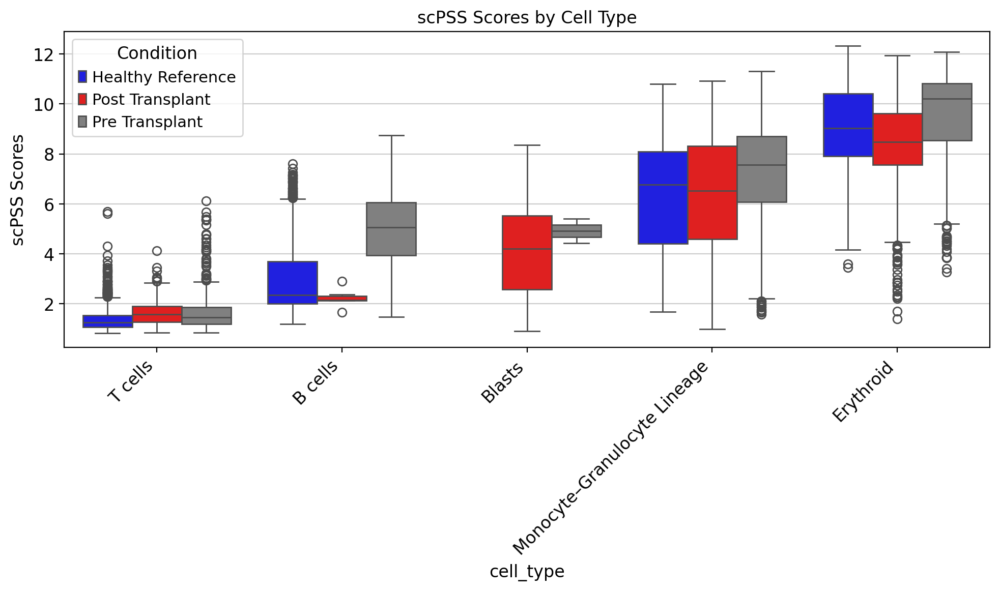

In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Use consistent labels
scpss.adata.obs['condition_label'] = scpss.adata.obs['condition'].replace({
    'healthy': 'Healthy Reference',
    'pre_transplant': 'Pre Transplant',
    'post_transplant': 'Post Transplant'
})

# Drop NaNs
plot_df = scpss.adata.obs.dropna(subset=['scpss_scores'])

# Compute ordering: average scpss_distances for Pre Transplant per cell_type
ordering_df = plot_df[plot_df['condition_label'] == 'Pre Transplant'].groupby('cell_type')['scpss_scores'].mean()
celltype_order = ordering_df.sort_values(ascending=True).index.tolist()

# Plot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=plot_df,
    x='cell_type',
    y='scpss_scores',
    hue='condition_label',
    order=celltype_order,
    palette=['blue', 'red', 'grey']
)

plt.xticks(rotation=45, ha='right')
plt.ylabel('scPSS Scores')
plt.title('scPSS Scores by Cell Type')
plt.legend(title='Condition')
plt.tight_layout()
plt.savefig("bmmc-propotion.svg")
plt.show()


categories: healthy, pathological, reference
var_group_labels: pathological


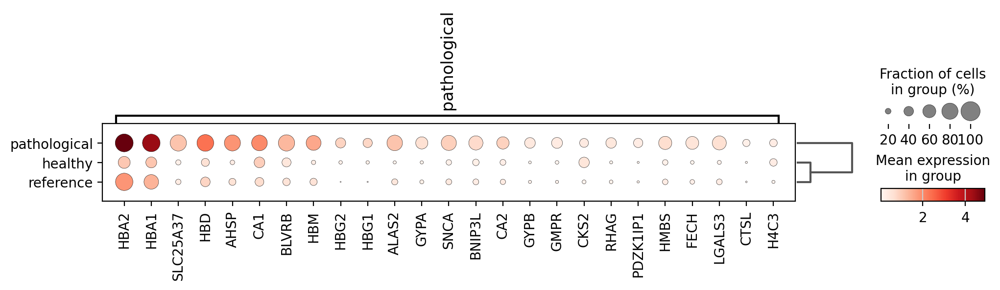

In [54]:
ad_test = scpss.adata.copy()

ad_test.var_names = ad_test.var_names.astype(str)
ad_test.var_names_make_unique()
ad_test.raw = ad_test.copy()
ad_test.raw.var['gene_symbol'] = ad_test.var['gene_symbol']
sc.tl.rank_genes_groups(ad_test, groupby='scpss_condition', reference='reference')

# Plot the top 5 DEGs per group
sc.pl.rank_genes_groups_dotplot(
    ad_test,
    n_genes=25,               # Top 5 genes per group
    groupby='scpss_condition',     # Grouping variable
    groups=['pathological'],
    gene_symbols='gene_symbol',
    show=True                # Show plot
)

## Use default k values for cell type wise application of scPSS

++++++++++++++
Monocyte–Granulocyte Lineage
++++++++++++++
Num healthy:  695
Num pre:  1593
Num post:  950


2025-07-17 15:19:16,176 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


✅ PCA Complete.


2025-07-17 15:19:16,692 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-07-17 15:19:16,710 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-07-17 15:19:17,409 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-07-17 15:19:18,076 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-07-17 15:19:18,733 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2025-07-17 15:19:19,476 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2025-07-17 15:19:20,139 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


✅ Harmony Integration Complete.
✅ Found Optimal Parameters.
✅ Stored distances and conditions in Anndata object.
categories: healthy, pathological, reference
var_group_labels: pathological


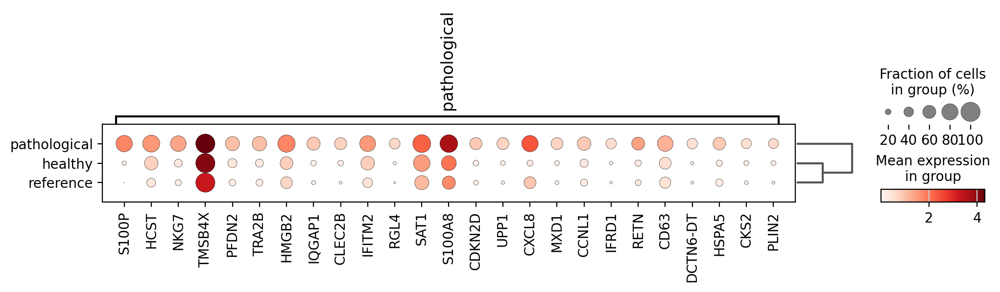

++++++++++++++
Erythroid
++++++++++++++
Num healthy:  740
Num pre:  5114
Num post:  1637


2025-07-17 15:19:33,034 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


✅ PCA Complete.


2025-07-17 15:19:35,258 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-07-17 15:19:35,297 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-07-17 15:19:36,711 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-07-17 15:19:38,503 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-07-17 15:19:40,596 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2025-07-17 15:19:42,058 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2025-07-17 15:19:43,499 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2025-07-17 15:19:44,884 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2025-07-17 15:19:46,233 - harmonypy - INFO - Iteration 8 of 10
INFO:harmonypy:Iteration 8 of 10
2025-07-17 15:19:47,555 - harmonypy - INFO - Iteration 9 of 10
INFO:harmonypy:Iteration 9 of

✅ Harmony Integration Complete.
✅ Found Optimal Parameters.
✅ Stored distances and conditions in Anndata object.
categories: healthy, pathological, reference
var_group_labels: pathological


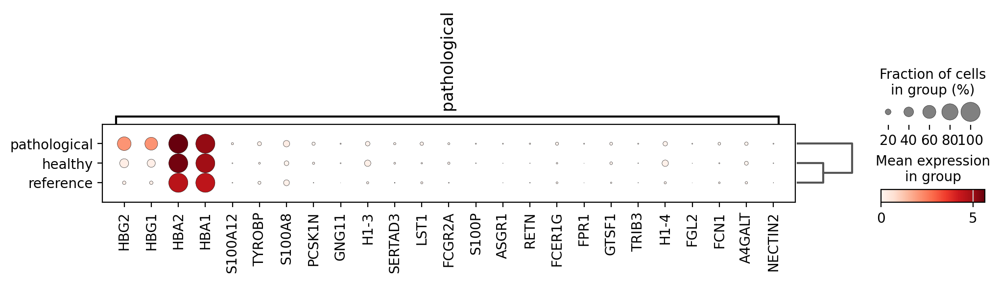

++++++++++++++
T cells
++++++++++++++
Num healthy:  2362
Num pre:  637
Num post:  573


2025-07-17 15:19:59,273 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


✅ PCA Complete.


2025-07-17 15:19:59,792 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-07-17 15:19:59,822 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-07-17 15:20:00,462 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-07-17 15:20:01,166 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


✅ Harmony Integration Complete.
✅ Found Optimal Parameters.
✅ Stored distances and conditions in Anndata object.
categories: healthy, pathological, reference
var_group_labels: pathological


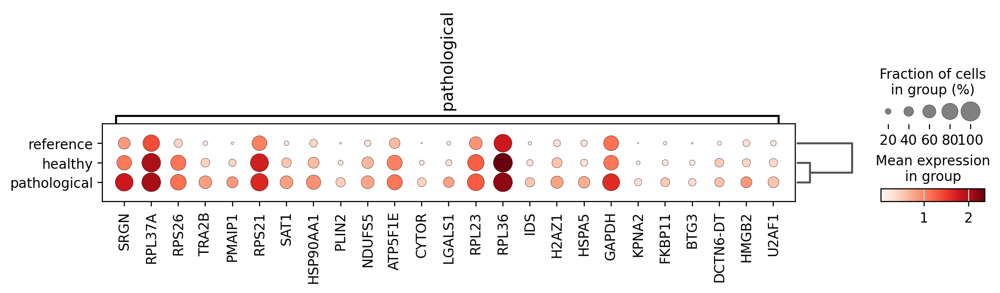

++++++++++++++
B cells
++++++++++++++
Num healthy:  660
Num pre:  179
Num post:  7


2025-07-17 15:20:08,496 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2025-07-17 15:20:08,664 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-07-17 15:20:08,669 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10


✅ PCA Complete.


2025-07-17 15:20:08,745 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-07-17 15:20:08,805 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-07-17 15:20:08,876 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations


✅ Harmony Integration Complete.
✅ Found Optimal Parameters.
✅ Stored distances and conditions in Anndata object.
categories: healthy, pathological, reference
var_group_labels: pathological


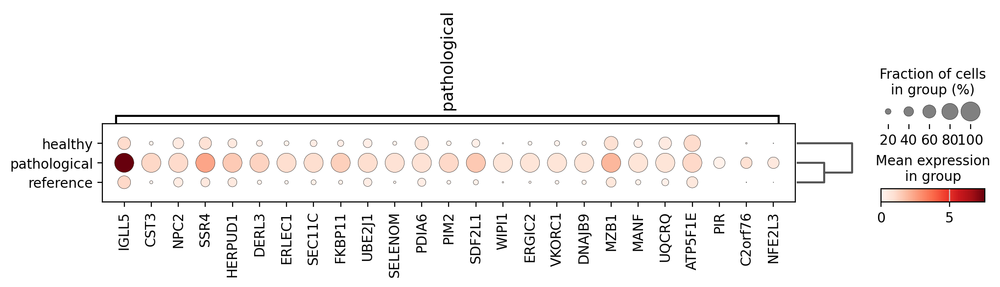

++++++++++++++
Blasts
++++++++++++++
Num healthy:  0
Num pre:  2
Num post:  1707


2025-07-17 15:20:12,259 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


✅ PCA Complete.


2025-07-17 15:20:12,538 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2025-07-17 15:20:12,562 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2025-07-17 15:20:12,792 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2025-07-17 15:20:13,024 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2025-07-17 15:20:13,252 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2025-07-17 15:20:13,496 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2025-07-17 15:20:13,649 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2025-07-17 15:20:13,730 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2025-07-17 15:20:13,827 - harmonypy - INFO - Iteration 8 of 10
INFO:harmonypy:Iteration 8 of 10
2025-07-17 15:20:13,927 - harmonypy - INFO - Iteration 9 of 10
INFO:harmonypy:Iteration 9 of

✅ Harmony Integration Complete.
axis 1 is out of bounds for array of dimension 1


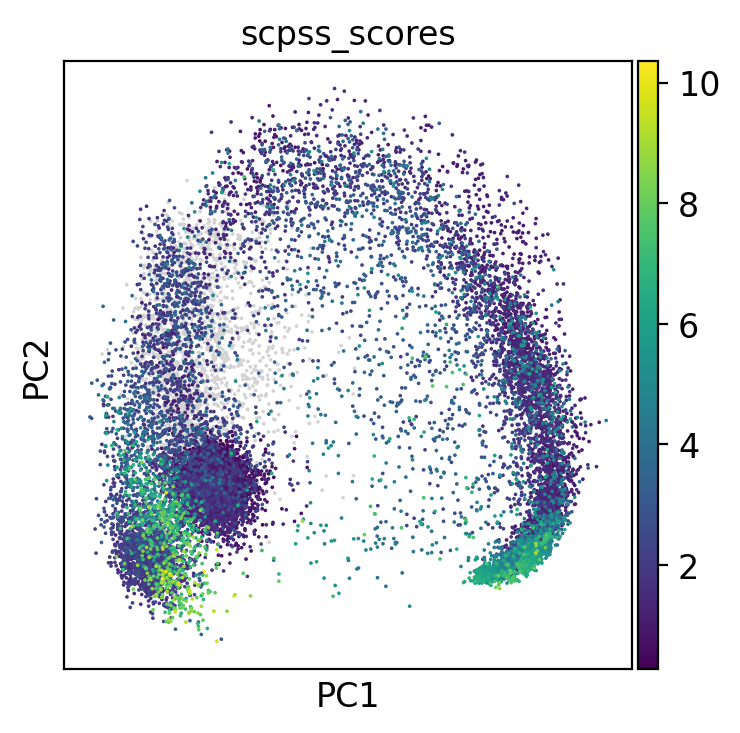

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# To collect proportions
prop_data = []

healthy_patient_ids = ad[ad.obs['condition'] == 'healthy'].obs['patient_id'].unique()
bmmc_patient_ids = ad[ad.obs['condition'] != 'healthy'].obs['patient_id'].unique()

for celltype in ad.obs['cell_type'].unique():
    try:
        print("++++++++++++++")
        print(celltype)
        print("++++++++++++++")
        adc = ad[ad.obs['cell_type'] == celltype]

        print('Num healthy: ', adc[adc.obs['condition'] == 'healthy'].shape[0])
        print('Num pre: ', adc[adc.obs['condition'] == 'pre_transplant'].shape[0])
        print('Num post: ', adc[adc.obs['condition'] == 'post_transplant'].shape[0])

        scpss = scPSS(adc, 'patient_id', healthy_patient_ids, bmmc_patient_ids)
        scpss.harmony_integrate()

        params = scpss.find_optimal_parameters()
        scpss.set_distance_and_condition()

        ad_que = scpss.adata[scpss.query_mask]

        dists_ref_ref = scpss.adata.obs.loc[scpss.reference_mask, 'scpss_scores']
        dists_que_ref = scpss.adata.obs.loc[scpss.query_mask, 'scpss_scores']

        dists_que_healthy = dists_que_ref[ad_que.obs['condition'] == 'post_transplant']
        dists_que_disease = dists_que_ref[ad_que.obs['condition'] == 'pre_transplant']

        ad_ref = scpss.adata[scpss.reference_mask]
        ad_post = ad_que[ad_que.obs['condition'] == 'post_transplant']
        ad_pre  = ad_que[ad_que.obs['condition'] == 'pre_transplant']

        # Compute proportions
        prop_ref = np.mean(ad_ref.obs['scpss_outlier'] == 'Outlier')
        prop_post = np.mean(ad_post.obs['scpss_outlier'] == 'Outlier')
        prop_pre = np.mean(ad_pre.obs['scpss_outlier'] == 'Outlier')

        # Append to plot data
        if ad_ref.shape[0] > 10: prop_data.append({'cell_type': celltype, 'condition': 'Reference', 'proportion': prop_ref})
        if ad_post.shape[0]> 10: prop_data.append({'cell_type': celltype, 'condition': 'Post Transplant', 'proportion': prop_post})
        if ad_pre.shape[0] > 10: prop_data.append({'cell_type': celltype, 'condition': 'Pre Transplant', 'proportion': prop_pre})

        # DEG
        ad_test = scpss.adata.copy()

        ad_test.var_names = ad_test.var_names.astype(str)
        ad_test.var_names_make_unique()
        ad_test.raw = ad_test.copy()
        ad_test.raw.var['gene_symbol'] = ad_test.var['gene_symbol']
        sc.tl.rank_genes_groups(ad_test, groupby='scpss_condition', reference='reference')

        sc.pl.rank_genes_groups_dotplot(
            ad_test,
            n_genes=25,               # Top 5 genes per group
            groupby='scpss_condition',     # Grouping variable
            groups=['pathological'],
            gene_symbols='gene_symbol',
            show=True                # Show plot
        )
        ad.obs.loc[ad.obs['cell_type'] == celltype, 'scpss_scores'] = scpss.adata.obs['scpss_scores']

    except Exception as e:
        print(e)

sc.pl.pca(ad, color=['scpss_scores'], show=False)
plt.savefig("bmmc-scpss_scores_sep.svg")

In [ ]:
df_prop = pd.DataFrame(prop_data)

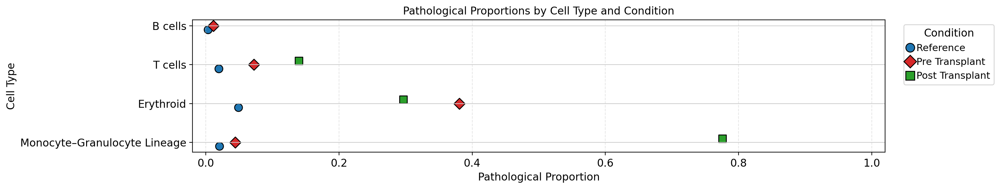

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# DataFrame 'df_prop' must have these columns:
# 'cell_type', 'condition', 'proportion'

# Define unique markers and colors for each condition
marker_map = {
    'Reference': 'o',          # Circle
    'Pre Transplant': 'D',     # Diamond
    'Post Transplant': 's'     # Square
}
color_map = {
    'Reference': '#1f77b4',       # blue
    'Pre Transplant': '#d62728',  # red
    'Post Transplant': '#2ca02c'  # green
}

# Assign y positions to each cell type
cell_types = df_prop['cell_type'].unique()
cell_type_pos = {ct: i for i, ct in enumerate(cell_types)}

# Offset within each cell type for visual separation
offset_map = {
    'Reference': -0.1,
    'Pre Transplant': 0,
    'Post Transplant': 0.1
}

plt.figure(figsize=(16, 0.8 * len(cell_types)))

# Plot each row as a scatter point
for _, row in df_prop.iterrows():
    y_base = cell_type_pos[row['cell_type']]
    y_offset = offset_map[row['condition']]
    plt.scatter(
        x=row['proportion'],
        y=y_base + y_offset,
        marker=marker_map[row['condition']],
        color=color_map[row['condition']],
        s=80,
        label=row['condition'],
        edgecolor='black'
    )

# Customize y-axis
plt.yticks(list(cell_type_pos.values()), list(cell_type_pos.keys()))
plt.xlabel('Pathological Proportion')
plt.ylabel('Cell Type')
plt.xlim(0, 1.05)
plt.grid(axis='x', linestyle='--', alpha=0.5)

# Unique legend handles to avoid duplicates
handles = []
for condition in ['Reference', 'Pre Transplant', 'Post Transplant']:
    handles.append(plt.Line2D([0], [0],
        marker=marker_map[condition], color='w',
        markerfacecolor=color_map[condition], markeredgecolor='black',
        label=condition, markersize=10, linestyle=''))

plt.legend(handles=handles, title='Condition', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.title('Pathological Proportions by Cell Type and Condition')
plt.tight_layout()
plt.xlim([-.02, 1.02])
plt.savefig("bmmc-proportions-sep.svg")
plt.show()
